## Libraries Installation

In [175]:
!pip install mahotas

## Libraries Import

In [176]:
import cv2
from google.colab.patches import cv2_imshow
import h5py
import mahotas
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

## Images Preprocessing and HDF5 RGB Dataset Generation

In [177]:
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images

def preprocess_images(images, target_size=(512, 512)):
    processed_images = []
    for img in images:
        img = cv2.resize(img, target_size)
        processed_images.append(img)
    return np.array(processed_images)

def save_to_h5(images, filename='data.h5'):
    with h5py.File(filename, 'w') as hf:
        hf.create_dataset('images', data=images)

# Folders paths
syndrome_folder = 'syndrome_images'
non_syndrome_folder = 'non_syndrome_images'

# Load images from folders
syndrome_images = load_images_from_folder(syndrome_folder)
non_syndrome_images = load_images_from_folder(non_syndrome_folder)

# Save pre-processed images to HDF5 files
save_to_h5(preprocess_images(syndrome_images), filename='syndrome_data_rgb.h5')
save_to_h5(preprocess_images(non_syndrome_images), filename='non_syndrome_data_rgb.h5')

## HDF5 RGB Dataset Load

In [178]:
def load_data_from_h5(h5_path):
    with h5py.File(h5_path, 'r') as hf:
        images = np.array(hf['images'])
    return images

def generate_tensor_from_h5(h5_path):
    images = load_data_from_h5(h5_path)
    # To get input shape (n, 3, 512, 512)
    tensor = images.transpose(0, 3, 1, 2)
    tensor = torch.from_numpy(tensor).float()
    return tensor

syndrome_tensor = generate_tensor_from_h5('syndrome_data_rgb.h5')
non_syndrome_tensor = generate_tensor_from_h5('non_syndrome_data_rgb.h5')

print("Shape of syndrome tensor:", syndrome_tensor.shape)
print("Shape of non-syndrome tensor:", non_syndrome_tensor.shape)

Shape of syndrome tensor: torch.Size([100, 3, 512, 512])
Shape of non-syndrome tensor: torch.Size([100, 3, 512, 512])


## Stratified Train Test Split

In [179]:
# Concatenate the data arrays and create labels (0 for non-syndrome, 1 for syndrome)
X = np.concatenate([non_syndrome_tensor, syndrome_tensor], axis=0)
y = np.concatenate([np.zeros(non_syndrome_tensor.shape[0]), np.ones(syndrome_tensor.shape[0])])

# Split the data into stratified train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=57)

# Create H5 files and store the images
def store_images_in_h5(file_path, data, labels):
    with h5py.File(file_path, 'w') as hf:
        hf.create_dataset('data', data=data)
        hf.create_dataset('labels', data=labels)

store_images_in_h5('non_syndrome_train.h5', X_train[y_train == 0], y_train[y_train == 0])
store_images_in_h5('non_syndrome_test.h5', X_test[y_test == 0], y_test[y_test == 0])
store_images_in_h5('syndrome_train.h5', X_train[y_train == 1], y_train[y_train == 1])
store_images_in_h5('syndrome_test.h5', X_test[y_test == 1], y_test[y_test == 1])

## Train Test Datasets Load

In [180]:
def load_data_from_h5(file_path):
    with h5py.File(file_path, 'r') as hf:
        data = np.array(hf['data'])
        tensor = torch.from_numpy(data).float()
    return tensor

# Example of how to use the function:
non_syndrome_tensor_train = load_data_from_h5('non_syndrome_train.h5')
non_syndrome_tensor_test = load_data_from_h5('non_syndrome_test.h5')
syndrome_tensor_train = load_data_from_h5('syndrome_train.h5')
syndrome_tensor_test = load_data_from_h5('syndrome_test.h5')

print("Shape of syndrome tensor train:", syndrome_tensor_train.shape)
print("Shape of non-syndrome tensor train:", non_syndrome_tensor_train.shape)
print("Shape of syndrome tensor test:", syndrome_tensor_test.shape)
print("Shape of non-syndrome tensor test:", non_syndrome_tensor_test.shape)

Shape of syndrome tensor train: torch.Size([80, 3, 512, 512])
Shape of non-syndrome tensor train: torch.Size([80, 3, 512, 512])
Shape of syndrome tensor test: torch.Size([20, 3, 512, 512])
Shape of non-syndrome tensor test: torch.Size([20, 3, 512, 512])


## Data Augmentation on Training Dataset

In [181]:
import torch
from torchvision import transforms

def augment_data(images_tensor, num_augmentations=1):
    # Define torchvision transformations for data augmentation
    data_transforms = transforms.Compose([
        transforms.ToPILImage(),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(degrees=(-15, 15)),
        transforms.ToTensor()
    ])

    n, _, height, width = images_tensor.shape

    # Convert torch tensor to numpy array
    images_np = images_tensor.numpy()

    # Initialize an array to store augmented images
    augmented_images = np.zeros((n * (num_augmentations + 1), 3, height, width), dtype=np.uint8)

    for i in range(n):
        # Original image
        augmented_images[i * (num_augmentations + 1)] = images_np[i]

        for j in range(num_augmentations):
            # Apply torchvision transformations
            transformed_image = data_transforms(images_np[i, 0])

            # Convert back to numpy array and store in the augmented array
            augmented_images[i * (num_augmentations + 1) + j + 1] = np.array(transformed_image)[np.newaxis, :, :]

    # Convert numpy array back to torch tensor
    augmented_tensor = torch.from_numpy(augmented_images)

    return augmented_tensor

syndrome_rgb_augmented_tensor_train = augment_data(syndrome_tensor_train, num_augmentations=3)
non_syndrome_rgb_augmented_tensor_train = augment_data(non_syndrome_tensor_train, num_augmentations=3)

print("Shape of augmented syndrome tensor train:", syndrome_rgb_augmented_tensor_train.shape)
print("Shape of augmented non-syndrome tensor train:", non_syndrome_rgb_augmented_tensor_train.shape)

Shape of augmented syndrome tensor train: torch.Size([320, 3, 512, 512])
Shape of augmented non-syndrome tensor train: torch.Size([320, 3, 512, 512])


## HDF5 Grayscale Dataset Generation

In [182]:
def convert_to_grayscale_and_save(input_tensor, output_file_path):
    # Create a new HDF5 file for storing grayscale images
    with h5py.File(output_file_path, 'w') as output_file:
        # Move the channels to the last component
        input_tensor = input_tensor.permute(0, 2, 3, 1)
        # Create a dataset to store grayscale images
        grayscale_dataset = output_file.create_dataset('grayscale_images', shape=input_tensor.shape[:3], dtype=np.uint8)

        # Iterate through each image in the input tensor
        for i in range(input_tensor.shape[0]):
            # Convert the image to grayscale using cv2.COLOR_BGR2GRAY
            grayscale_image = cv2.cvtColor(input_tensor[i].numpy(), cv2.COLOR_BGR2GRAY)
            # Store the grayscale image in the dataset
            grayscale_dataset[i] = grayscale_image

convert_to_grayscale_and_save(syndrome_rgb_augmented_tensor_train, '/content/syndrome_grayscale_augmented_train.h5')
convert_to_grayscale_and_save(non_syndrome_rgb_augmented_tensor_train, '/content/non_syndrome_grayscale_augmented_train.h5')

convert_to_grayscale_and_save(syndrome_tensor_test, '/content/syndrome_grayscale_test.h5')
convert_to_grayscale_and_save(non_syndrome_tensor_test, '/content/non_syndrome_grayscale_test.h5')

## HDF5 Grayscale Dataset Load

In [183]:
def load_grayscale_data_from_h5(h5_path):
    with h5py.File(h5_path, 'r') as hf:
        images = np.array(hf['grayscale_images'])
    return images

def generate_grayscale_tensor_from_h5(h5_path):
    images = load_grayscale_data_from_h5(h5_path)
    # To get input shape (n, 3, 512, 512)
    tensor = torch.from_numpy(images)
    return tensor

syndrome_grayscale_augmented_tensor_train = generate_grayscale_tensor_from_h5('/content/syndrome_grayscale_augmented_train.h5')
non_syndrome_grayscale_augmented_tensor_train = generate_grayscale_tensor_from_h5('/content/non_syndrome_grayscale_augmented_train.h5')

syndrome_grayscale_tensor_test = generate_grayscale_tensor_from_h5('/content/syndrome_grayscale_test.h5')
non_syndrome_grayscale_tensor_test = generate_grayscale_tensor_from_h5('/content/non_syndrome_grayscale_test.h5')

print("Shape of augmented syndrome grayscale tensor train:", syndrome_grayscale_augmented_tensor_train.shape)
print("Shape of augmented non-syndrome grayscale tensor train:", non_syndrome_grayscale_augmented_tensor_train.shape)

print("Shape of syndrome grayscale tensor test:", syndrome_grayscale_tensor_test.shape)
print("Shape of non-syndrome grayscale tensor test:", non_syndrome_grayscale_tensor_test.shape)

Shape of augmented syndrome grayscale tensor train: torch.Size([320, 512, 512])
Shape of augmented non-syndrome grayscale tensor train: torch.Size([320, 512, 512])
Shape of syndrome grayscale tensor test: torch.Size([20, 512, 512])
Shape of non-syndrome grayscale tensor test: torch.Size([20, 512, 512])


## Feature Extraction (Haralick Features)

In [184]:
def extract_haralick_features(input_tensor, output_file_path):
    # Create a new HDF5 file for storing grayscale images
    with h5py.File(output_file_path, 'w') as output_file:
        # Move the channels to the last component
        haralick_features = output_file.create_dataset('haralick_features', shape=(input_tensor.shape[0], 26), dtype=np.uint8)

        # Iterate through each image in the input tensor
        for i in range(input_tensor.shape[0]):
            features_mean = mahotas.features.haralick(input_tensor[i].numpy()).mean(axis=0)
            features_std = mahotas.features.haralick(input_tensor[i].numpy()).std(axis=0)
            haralick_features[i] = np.concatenate((features_mean, features_std), axis=0)

extract_haralick_features(syndrome_grayscale_augmented_tensor_train, '/content/syndrome_haralick_features_augmented_train.h5')
extract_haralick_features(non_syndrome_grayscale_augmented_tensor_train, '/content/non_syndrome_haralick_features_augmented_train.h5')

extract_haralick_features(syndrome_grayscale_tensor_test, '/content/syndrome_haralick_features_test.h5')
extract_haralick_features(non_syndrome_grayscale_tensor_test, '/content/non_syndrome_haralick_features_test.h5')

## Haralick Features Load

In [185]:
def load_haralick_features_from_h5(file_path):
    with h5py.File(file_path, 'r') as file:
        # Assuming the dataset name is 'haralick_features'
        haralick_features_dataset = file['haralick_features']

        # Get the number of images and the number of features
        num_images, num_features = haralick_features_dataset.shape

        # Create a tensor to store Haralick features
        haralick_features_tensor = torch.zeros((num_images, num_features), dtype=torch.float32)

        # Iterate through each image in the dataset
        for i in range(num_images):
            # Read the Haralick features from the dataset
            features = haralick_features_dataset[i]

            # Store the features in the tensor
            haralick_features_tensor[i, :] = torch.from_numpy(features)

        return haralick_features_tensor

syndrome_haralick_augmented_features_train = load_haralick_features_from_h5('/content/syndrome_haralick_features_augmented_train.h5')
non_syndrome_haralick_augmented_features_train = load_haralick_features_from_h5('/content/non_syndrome_haralick_features_augmented_train.h5')

syndrome_haralick_features_test = load_haralick_features_from_h5('/content/syndrome_haralick_features_test.h5')
non_syndrome_haralick_features_test = load_haralick_features_from_h5('/content/non_syndrome_haralick_features_test.h5')

print("Shape of augmented syndrome haralick features tensor train:", syndrome_haralick_augmented_features_train.shape)
print("Shape of augmented non-syndrome haralick features tensor train:", non_syndrome_haralick_augmented_features_train.shape)

print("Shape of syndrome haralick features tensor test:", syndrome_haralick_features_test.shape)
print("Shape of non-syndrome haralick features tensor test:", non_syndrome_haralick_features_test.shape)

Shape of augmented syndrome haralick features tensor train: torch.Size([320, 26])
Shape of augmented non-syndrome haralick features tensor train: torch.Size([320, 26])
Shape of syndrome haralick features tensor test: torch.Size([20, 26])
Shape of non-syndrome haralick features tensor test: torch.Size([20, 26])


## Connected Components Analysis Features (Lymphocyte Features)

In [186]:
def get_average_neighbors_within_radius(stats, radius):
    # Extract coordinates
    centers = stats[:, [cv2.CC_STAT_LEFT, cv2.CC_STAT_TOP]] + stats[:, [cv2.CC_STAT_WIDTH, cv2.CC_STAT_HEIGHT]] // 2

    # Calculate the pairwise distances using vectorized operations
    pairwise_distances = np.linalg.norm(centers[:, np.newaxis, :] - centers, axis=2)

    # Create a binary mask indicating whether the distance is within the specified radius
    neighbors_mask = (pairwise_distances > 0) & (pairwise_distances <= radius)

    # Count the number of neighbors for each component
    num_neighbors = np.sum(neighbors_mask, axis=1)

    # Calculate the average number of neighbors
    average_neighbors = np.mean(num_neighbors) if num_neighbors.size > 0 else 0.0

    return average_neighbors

def get_average_distance(stats):
    # Extract coordinates
    centers = stats[:, [cv2.CC_STAT_LEFT, cv2.CC_STAT_TOP]] + stats[:, [cv2.CC_STAT_WIDTH, cv2.CC_STAT_HEIGHT]] // 2

    # Reshape the centers to enable broadcasting
    centers = centers[:, np.newaxis, :]

    # Calculate the pairwise distances using vectorized operations
    pairwise_distances = np.linalg.norm(centers - centers.transpose((1, 0, 2)), axis=2)

    # Mask diagonal values (distance to itself) and flatten the distances
    distances = pairwise_distances[np.triu(np.ones_like(pairwise_distances), k=1) == 1]

    # Calculate the average distance per point
    average_distance_per_point = np.sum(distances) / len(distances) if len(distances) > 0 else 0.0

    return average_distance_per_point


S-TRAIN


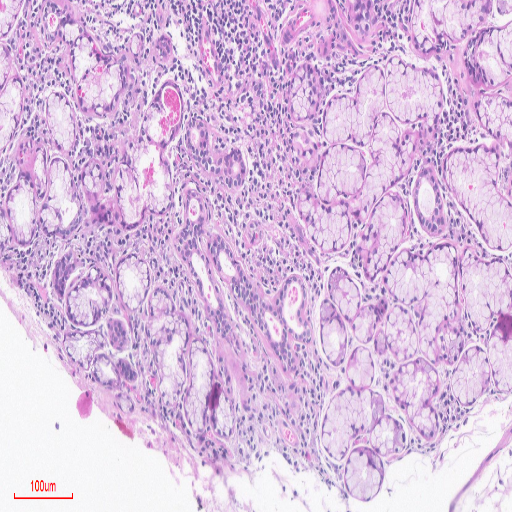

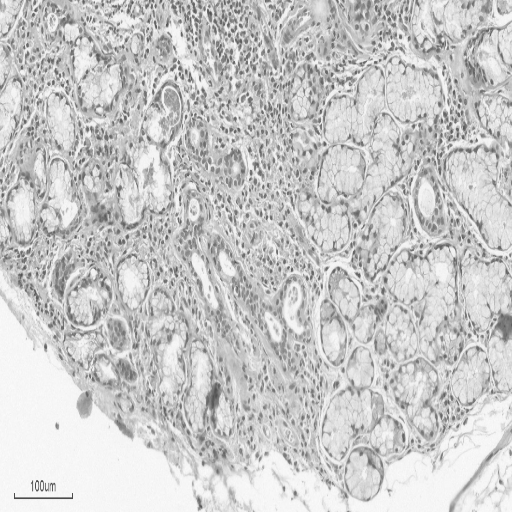

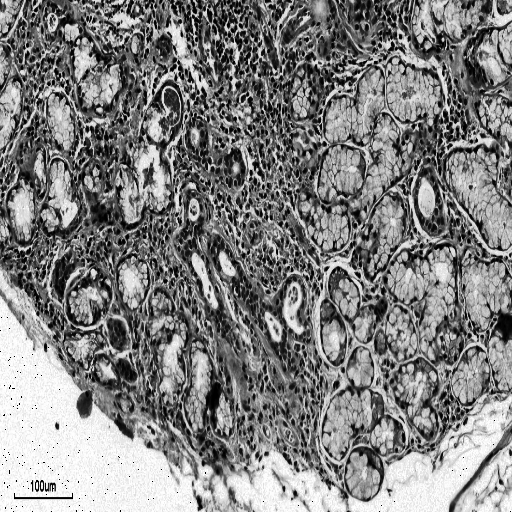

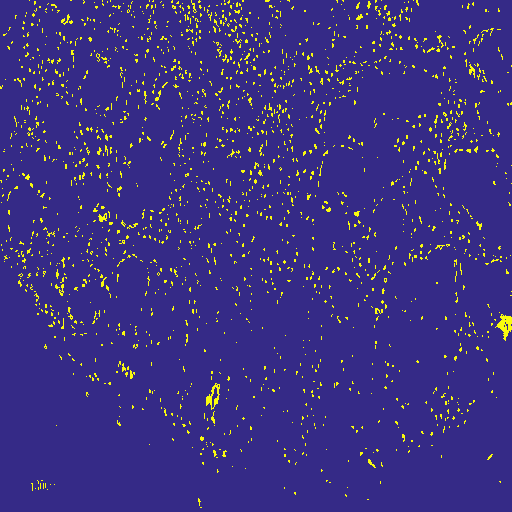


S-TRAIN


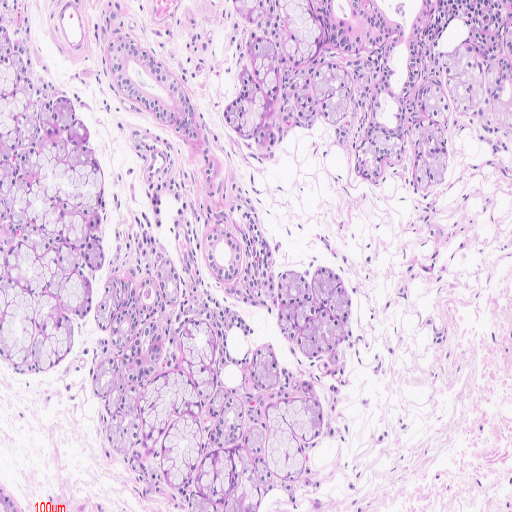

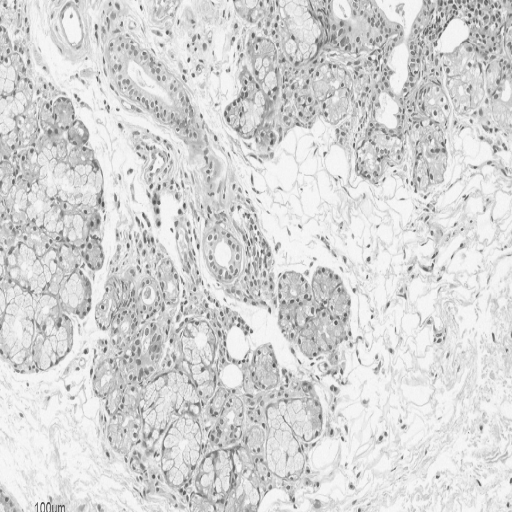

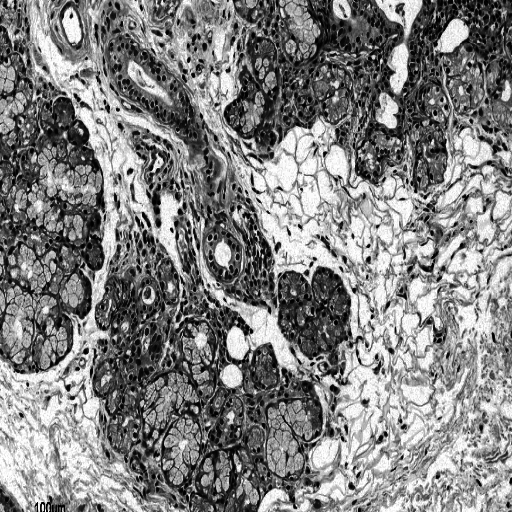

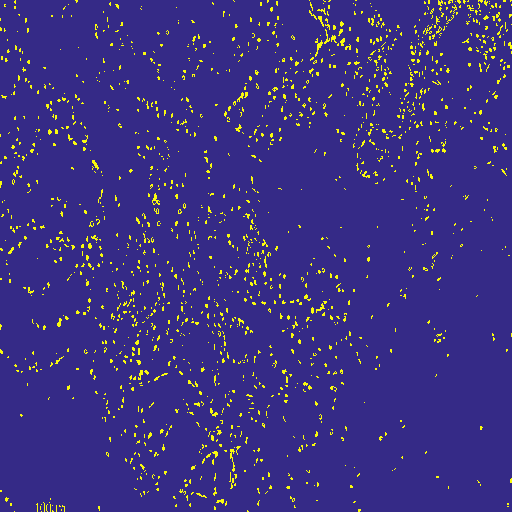


S-TRAIN


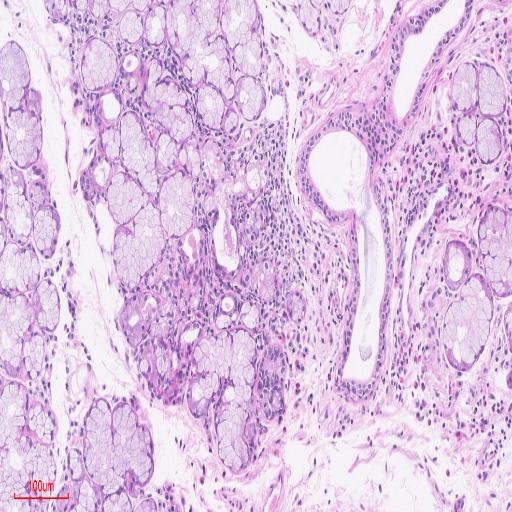

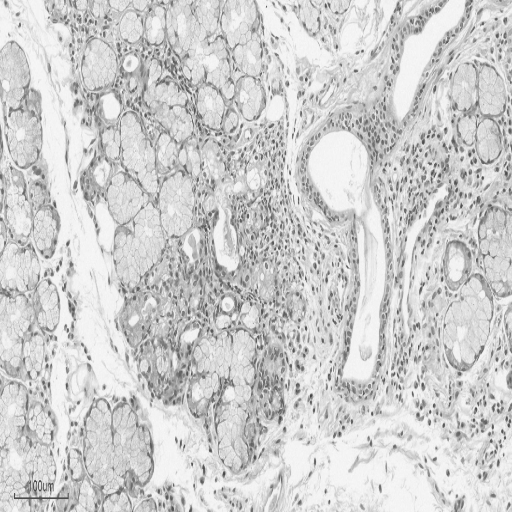

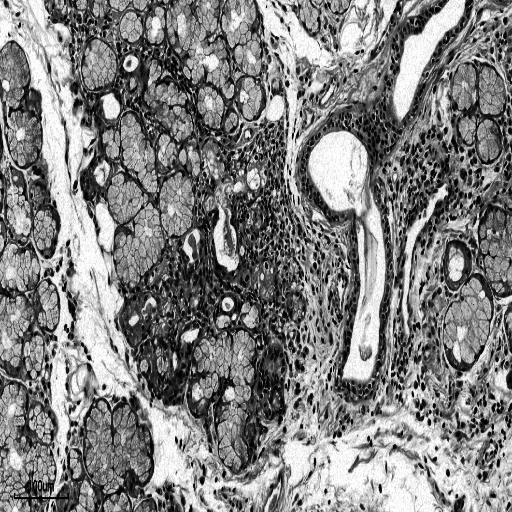

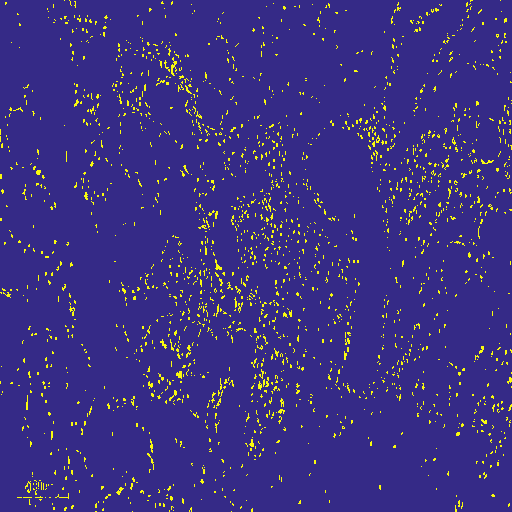


S-TRAIN


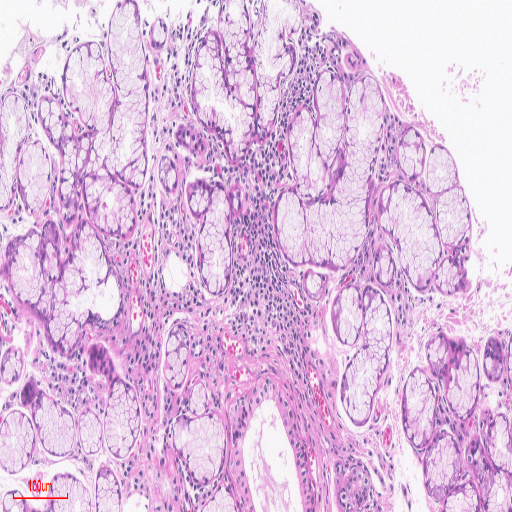

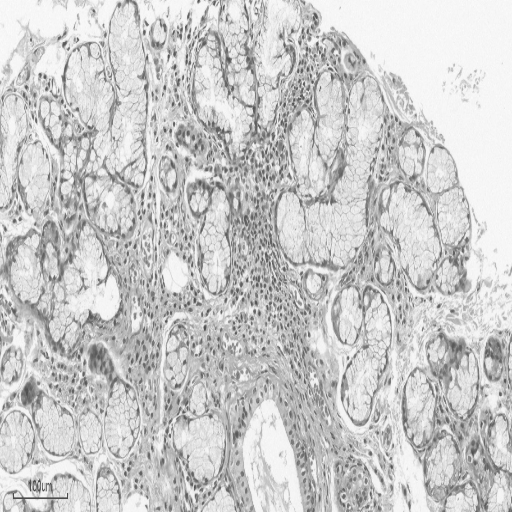

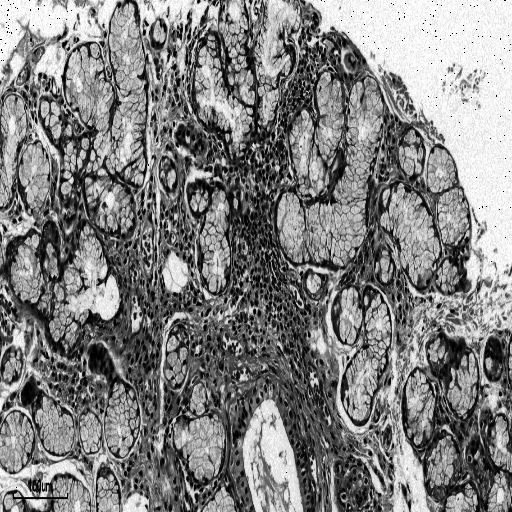

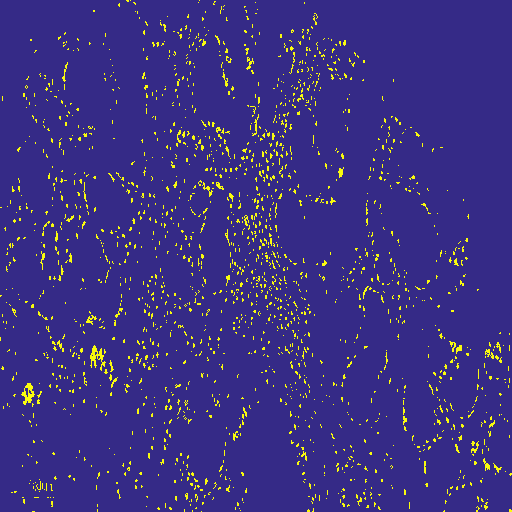


NS-TRAIN


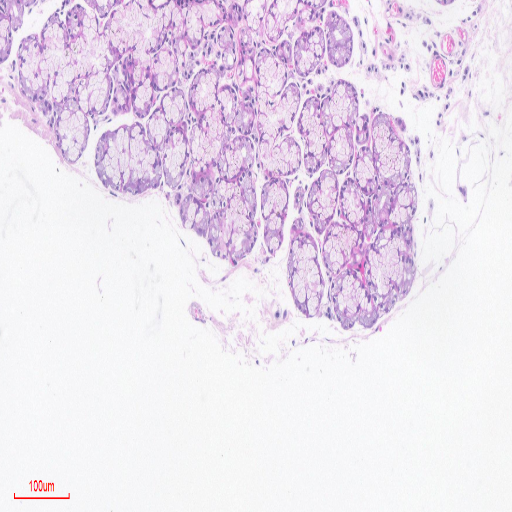

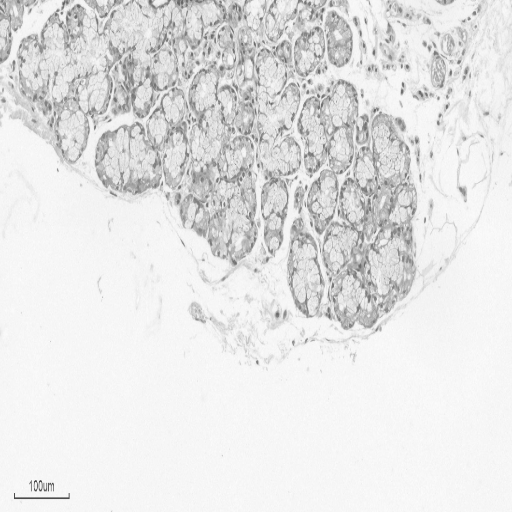

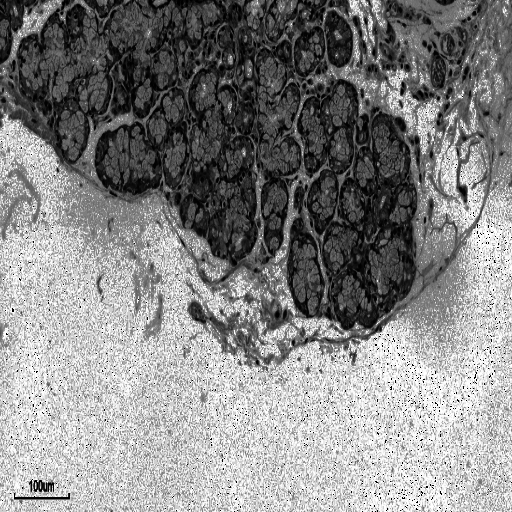

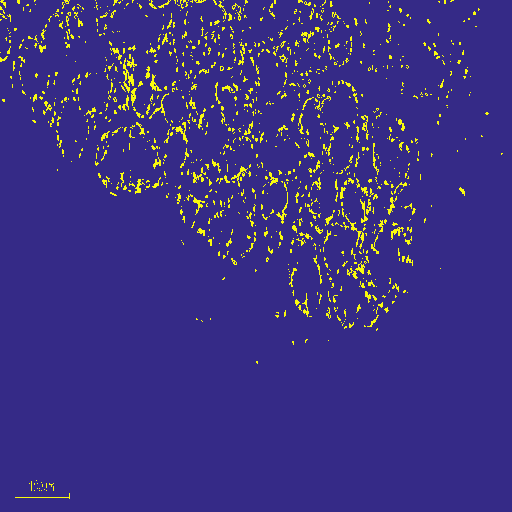


NS-TRAIN


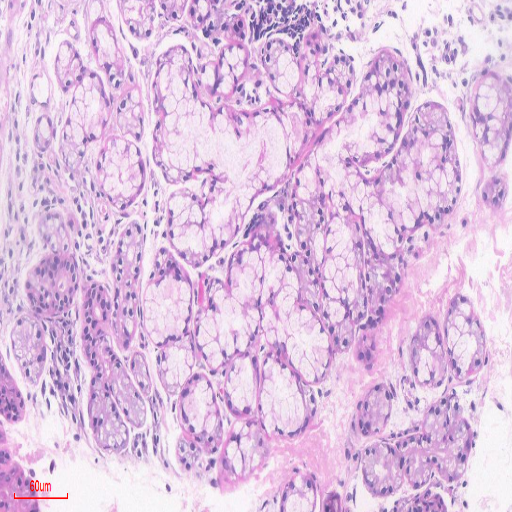

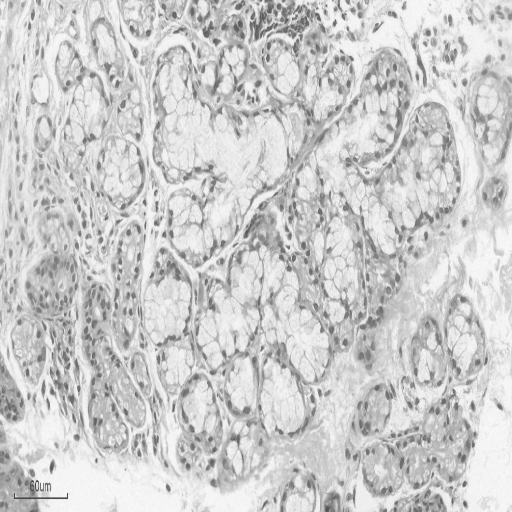

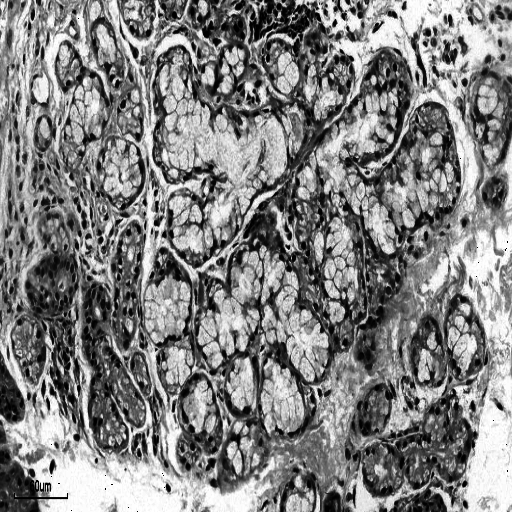

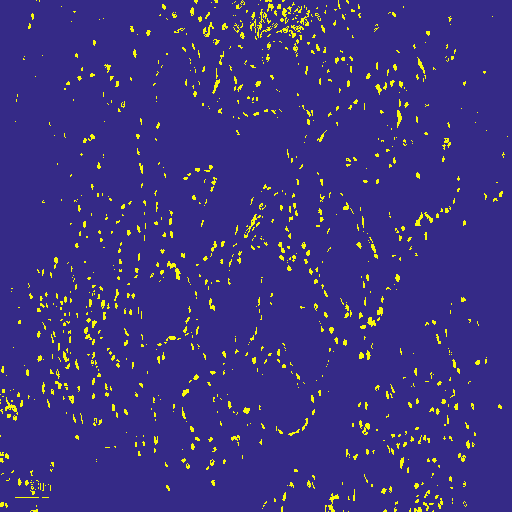


NS-TRAIN


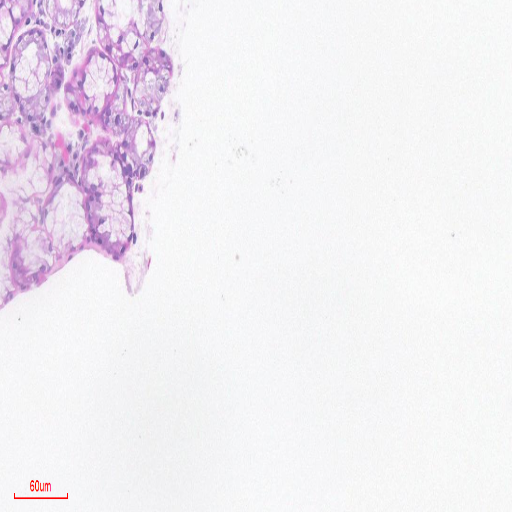

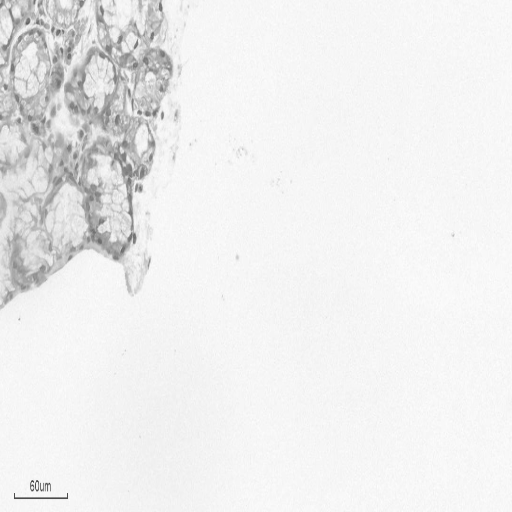

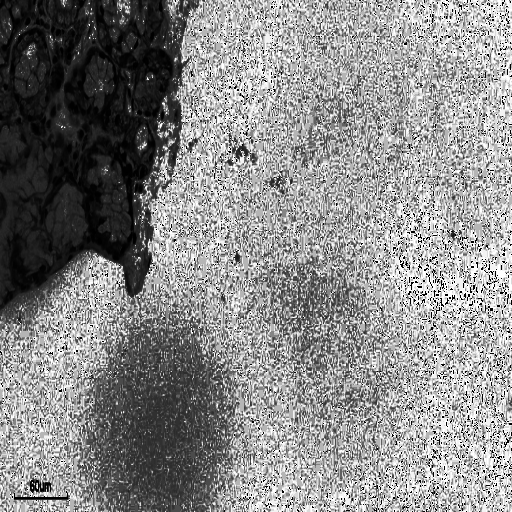

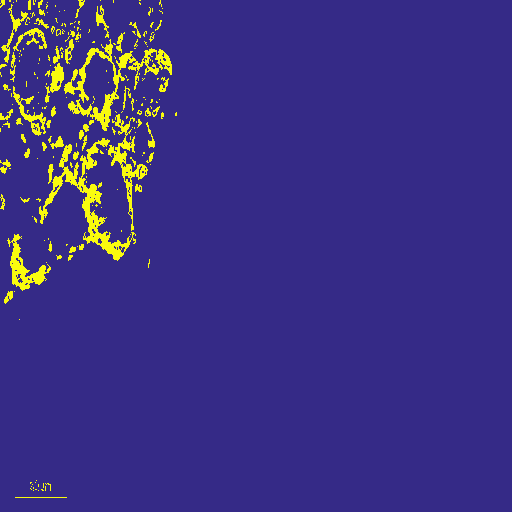


NS-TRAIN


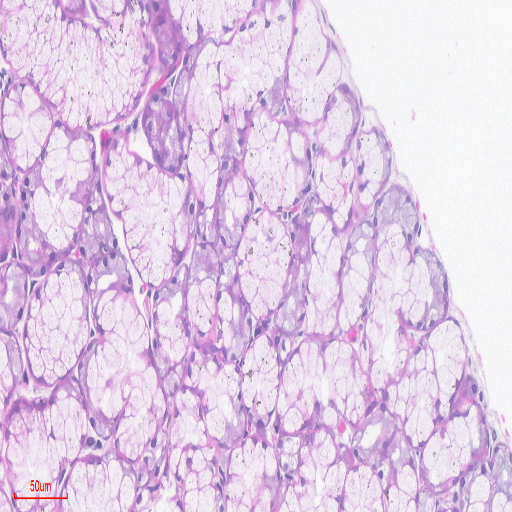

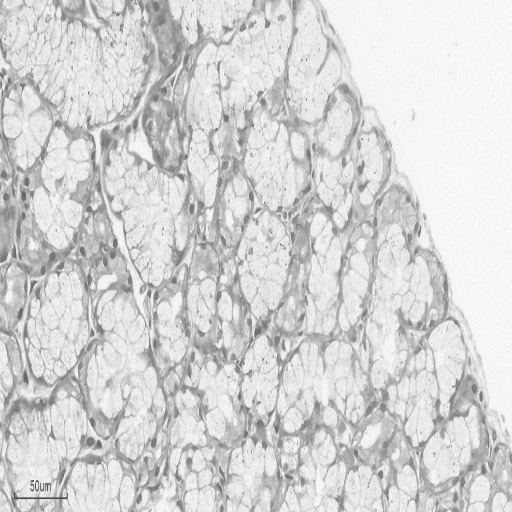

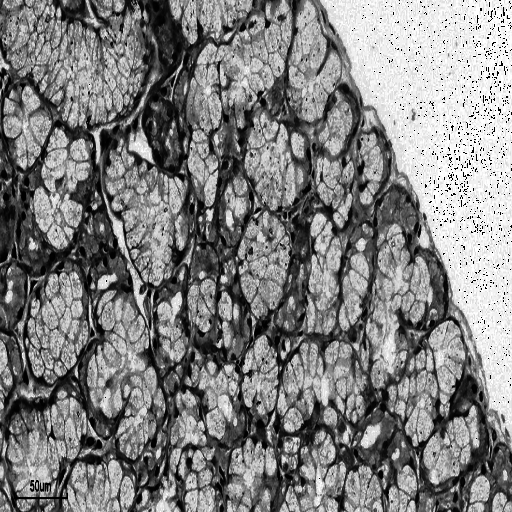

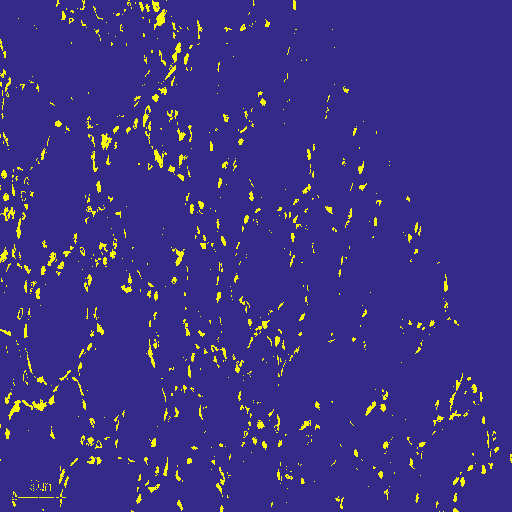


S-TEST


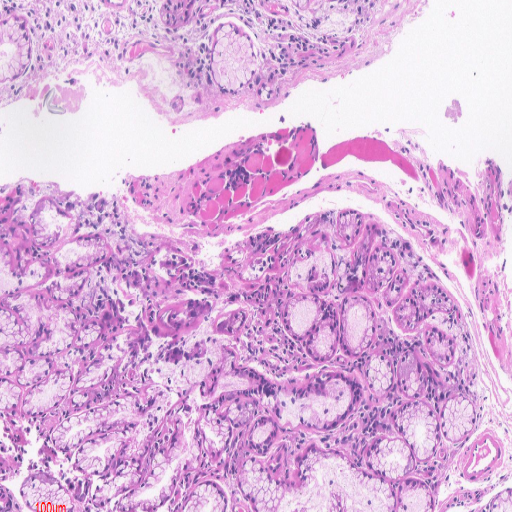

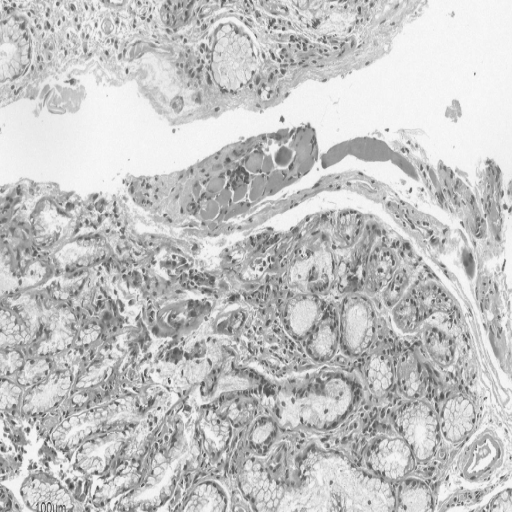

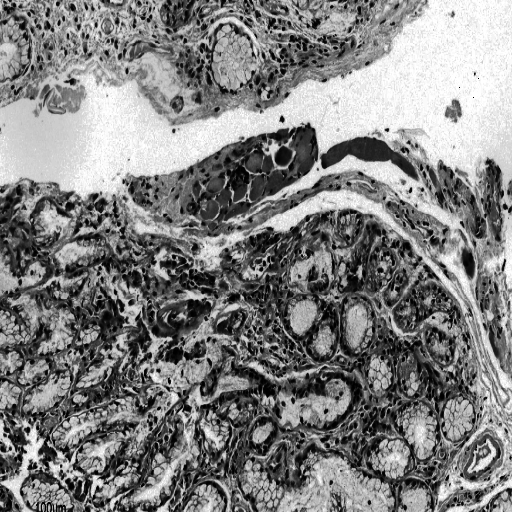

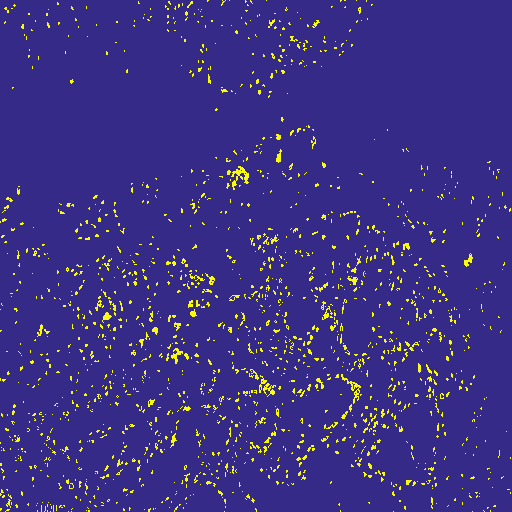


NS-TEST


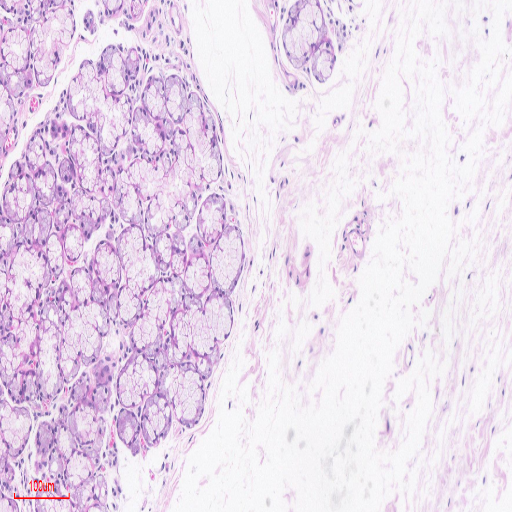

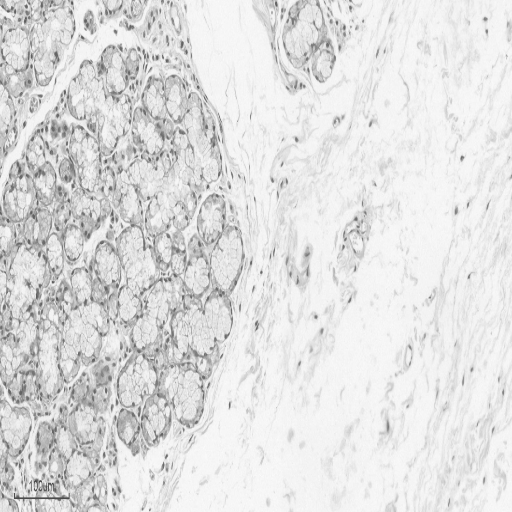

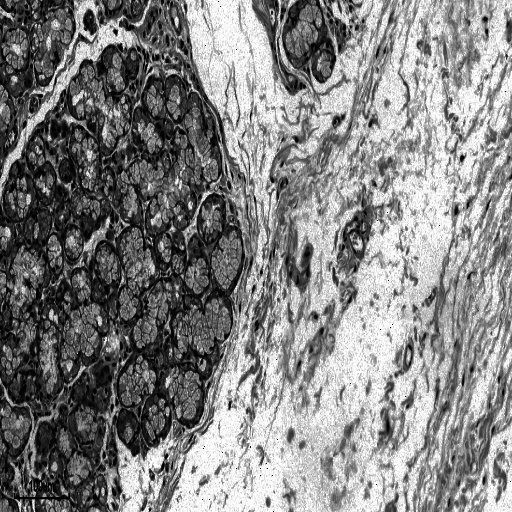

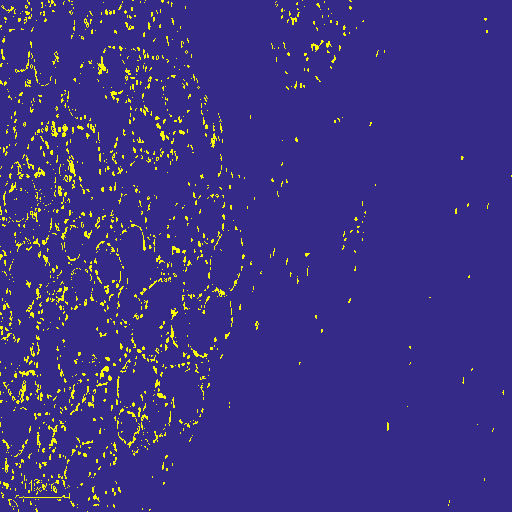


Shape of extended syndrome features tensor train: torch.Size([320, 29])
Shape of extended non-syndrome features tensor train: torch.Size([320, 29])
Shape of extended syndrome features tensor test: torch.Size([20, 29])
Shape of extended non-syndrome features tensor test: torch.Size([20, 29])


In [187]:
def get_connected_components_features(images, code):
    # Initialize a list to store the counts
    dark_point_counts = []
    neighbors_averages = []
    distances_averages = []

    # Iterate through each image in the tensor
    for i in range(images.shape[0]):
        # Convert torch tensor to NumPy array
        mask = (images[i] < 250).astype(np.uint8)
        masked = cv2.bitwise_and(images[i], images[i], mask=mask)
        equalized = cv2.equalizeHist(masked)

        binary = cv2.inRange(equalized, 1, 10)

        # Perform connected component analysis
        # Separate the two colors (e.g., 0 and 255)
        color_255 = (binary == 255).astype(np.uint8)  # Binary image for color 255

        # Apply connected components analysis separately
        _, _, stats_255, _ = cv2.connectedComponentsWithStats(color_255, connectivity=8)

        # Count the number of components for each color
        dark_points_count = len(stats_255) - 1  # Exclude the background
        average_neighbors = get_average_neighbors_within_radius(stats_255, 50.0)
        average_distance = get_average_distance(stats_255)

        # Append the count to the list
        dark_point_counts.append(dark_points_count)
        neighbors_averages.append(average_neighbors)
        distances_averages.append(average_distance)


        # Visualize the result
        NAMES = ["S-TRAIN", "NS-TRAIN", "S-TEST", "NS-TEST"]
        freq = 100 if "TRAIN" in code else 20
        if i % freq == 0:
            print(code)
            IMAGES = [syndrome_rgb_augmented_tensor_train[i].permute(1, 2, 0).numpy(),
                      non_syndrome_rgb_augmented_tensor_train[i].permute(1, 2, 0).numpy(),
                      [] if "TRAIN" in code or i >= 25 else syndrome_tensor_test[i].permute(1, 2, 0).numpy(),
                      [] if "TRAIN" in code else non_syndrome_tensor_test[i].permute(1, 2, 0).numpy()]
            cv2_imshow(IMAGES[NAMES.index(code)])
            cv2_imshow(images[i])
            cv2_imshow(equalized)
            cv2_imshow(cv2.applyColorMap(binary, cv2.COLORMAP_PARULA))
            print()

    # Convert the list of counts to a NumPy array and then to a torch tensor
    dark_point_counts_tensor = torch.tensor(dark_point_counts, dtype=torch.int32)
    neighbors_averages_tensor = torch.tensor(neighbors_averages, dtype=torch.float32)
    distances_averages_tensor = torch.tensor(distances_averages, dtype=torch.float32)

    return dark_point_counts_tensor, neighbors_averages_tensor, distances_averages_tensor

def add_cca_features(features_tensor, grayscale_tensor, code):
    n, _ = features_tensor.shape

    # Convert torch tensor to numpy arrays
    features_np = features_tensor.numpy()
    grayscale_np = grayscale_tensor.numpy()

    dark_points_count, neighbors_averages, distances_averages = get_connected_components_features(grayscale_np, code)

    # Append the average grayscale color as an additional feature to each vector
    augmented_features_np = np.concatenate((features_np, dark_points_count[:, np.newaxis], neighbors_averages[:, np.newaxis], distances_averages[:, np.newaxis]), axis=1)

    # Convert numpy array back to torch tensor
    augmented_features_tensor = torch.from_numpy(augmented_features_np)

    return augmented_features_tensor

syndrome_features_extended_train_29 = add_cca_features(syndrome_haralick_augmented_features_train, syndrome_grayscale_augmented_tensor_train, "S-TRAIN")
non_syndrome_features_extended_train_29 = add_cca_features(non_syndrome_haralick_augmented_features_train, non_syndrome_grayscale_augmented_tensor_train, "NS-TRAIN")

syndrome_features_extended_test_29 = add_cca_features(syndrome_haralick_features_test, syndrome_grayscale_tensor_test, "S-TEST")
non_syndrome_features_extended_test_29 = add_cca_features(non_syndrome_haralick_features_test, non_syndrome_grayscale_tensor_test, "NS-TEST")

print("Shape of extended syndrome features tensor train:", syndrome_features_extended_train_29.shape)
print("Shape of extended non-syndrome features tensor train:", non_syndrome_features_extended_train_29.shape)

print("Shape of extended syndrome features tensor test:", syndrome_features_extended_test_29.shape)
print("Shape of extended non-syndrome features tensor test:", non_syndrome_features_extended_test_29.shape)

## Lymphocyte Features Visualization

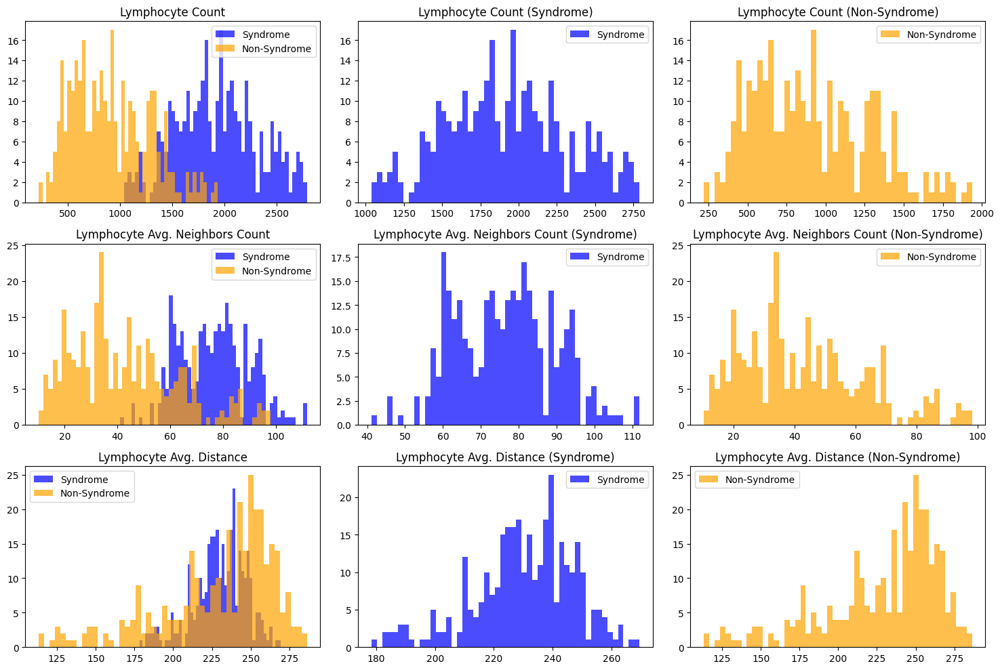

Lymphocyte Count (Syndrome) Mean: 1922.50
Lymphocyte Count (Syndrome) Std: 399.47
Lymphocyte Count (Non-Syndrome) Mean: 909.10
Lymphocyte Count (Non-Syndrome) Std: 371.87
Lymphocyte Avg. Neighbors Count (Syndrome) Mean: 76.50
Lymphocyte Avg. Neighbors Count (Syndrome) Std: 13.11
Lymphocyte Avg. Neighbors Count (Non-Syndrome) Mean: 42.94
Lymphocyte Avg. Neighbors Count (Non-Syndrome) Std: 20.10
Lymphocyte Avg. Distance (Syndrome) Mean: 230.23
Lymphocyte Avg. Distance (Syndrome) Std: 16.94
Lymphocyte Avg. Distance (Non-Syndrome) Mean: 229.09
Lymphocyte Avg. Distance (Non-Syndrome) Std: 36.82


In [188]:
# Plot connected components features
# Extract the last three columns
dark_points_count_syndrome = syndrome_features_extended_train_29[:, -3]
avg_neighbors_count_syndrome = syndrome_features_extended_train_29[:, -2]
avg_distance_syndrome = syndrome_features_extended_train_29[:, -1]

dark_points_count_non_syndrome = non_syndrome_features_extended_train_29[:, -3]
avg_neighbors_count_non_syndrome = non_syndrome_features_extended_train_29[:, -2]
avg_distance_non_syndrome = non_syndrome_features_extended_train_29[:, -1]

# Create subplots
fig, axs = plt.subplots(3, 3, figsize=(15, 10))

# Plot dark points count
axs[0, 0].hist(dark_points_count_syndrome, bins=50, color='blue', alpha=0.7, label='Syndrome')
axs[0, 0].hist(dark_points_count_non_syndrome, bins=50, color='orange', alpha=0.7, label='Non-Syndrome')
axs[0, 0].set_title('Lymphocyte Count')
axs[0, 0].legend()

# Plot avg neighbors count
axs[1, 0].hist(avg_neighbors_count_syndrome, bins=50, color='blue', alpha=0.7, label='Syndrome')
axs[1, 0].hist(avg_neighbors_count_non_syndrome, bins=50, color='orange', alpha=0.7, label='Non-Syndrome')
axs[1, 0].set_title('Lymphocyte Avg. Neighbors Count')
axs[1, 0].legend()

# Plot avg distance
axs[2, 0].hist(avg_distance_syndrome, bins=50, color='blue', alpha=0.7, label='Syndrome')
axs[2, 0].hist(avg_distance_non_syndrome, bins=50, color='orange', alpha=0.7, label='Non-Syndrome')
axs[2, 0].set_title('Lymphocyte Avg. Distance')
axs[2, 0].legend()

# Add individual histograms for better visibility
axs[0, 1].hist(dark_points_count_syndrome, bins=50, color='blue', alpha=0.7, label='Syndrome')
axs[0, 1].set_title('Lymphocyte Count (Syndrome)')
axs[0, 1].legend()

axs[1, 1].hist(avg_neighbors_count_syndrome, bins=50, color='blue', alpha=0.7, label='Syndrome')
axs[1, 1].set_title('Lymphocyte Avg. Neighbors Count (Syndrome)')
axs[1, 1].legend()

axs[2, 1].hist(avg_distance_syndrome, bins=50, color='blue', alpha=0.7, label='Syndrome')
axs[2, 1].set_title('Lymphocyte Avg. Distance (Syndrome)')
axs[2, 1].legend()

axs[0, 2].hist(dark_points_count_non_syndrome, bins=50, color='orange', alpha=0.7, label='Non-Syndrome')
axs[0, 2].set_title('Lymphocyte Count (Non-Syndrome)')
axs[0, 2].legend()

axs[1, 2].hist(avg_neighbors_count_non_syndrome, bins=50, color='orange', alpha=0.7, label='Non-Syndrome')
axs[1, 2].set_title('Lymphocyte Avg. Neighbors Count (Non-Syndrome)')
axs[1, 2].legend()

axs[2, 2].hist(avg_distance_non_syndrome, bins=50, color='orange', alpha=0.7, label='Non-Syndrome')
axs[2, 2].set_title('Lymphocyte Avg. Distance (Non-Syndrome)')
axs[2, 2].legend()

# Adjust layout
plt.tight_layout()
plt.show()

# Statistics
print(f'Lymphocyte Count (Syndrome) Mean: {np.mean(dark_points_count_syndrome.numpy()):.2f}')
print(f'Lymphocyte Count (Syndrome) Std: {np.std(dark_points_count_syndrome.numpy()):.2f}')
print(f'Lymphocyte Count (Non-Syndrome) Mean: {np.mean(dark_points_count_non_syndrome.numpy()):.2f}')
print(f'Lymphocyte Count (Non-Syndrome) Std: {np.std(dark_points_count_non_syndrome.numpy()):.2f}')
print(f'Lymphocyte Avg. Neighbors Count (Syndrome) Mean: {np.mean(avg_neighbors_count_syndrome.numpy()):.2f}')
print(f'Lymphocyte Avg. Neighbors Count (Syndrome) Std: {np.std(avg_neighbors_count_syndrome.numpy()):.2f}')
print(f'Lymphocyte Avg. Neighbors Count (Non-Syndrome) Mean: {np.mean(avg_neighbors_count_non_syndrome.numpy()):.2f}')
print(f'Lymphocyte Avg. Neighbors Count (Non-Syndrome) Std: {np.std(avg_neighbors_count_non_syndrome.numpy()):.2f}')
print(f'Lymphocyte Avg. Distance (Syndrome) Mean: {np.mean(avg_distance_syndrome.numpy()):.2f}')
print(f'Lymphocyte Avg. Distance (Syndrome) Std: {np.std(avg_distance_syndrome.numpy()):.2f}')
print(f'Lymphocyte Avg. Distance (Non-Syndrome) Mean: {np.mean(avg_distance_non_syndrome.numpy()):.2f}')
print(f'Lymphocyte Avg. Distance (Non-Syndrome) Std: {np.std(avg_distance_non_syndrome.numpy()):.2f}')

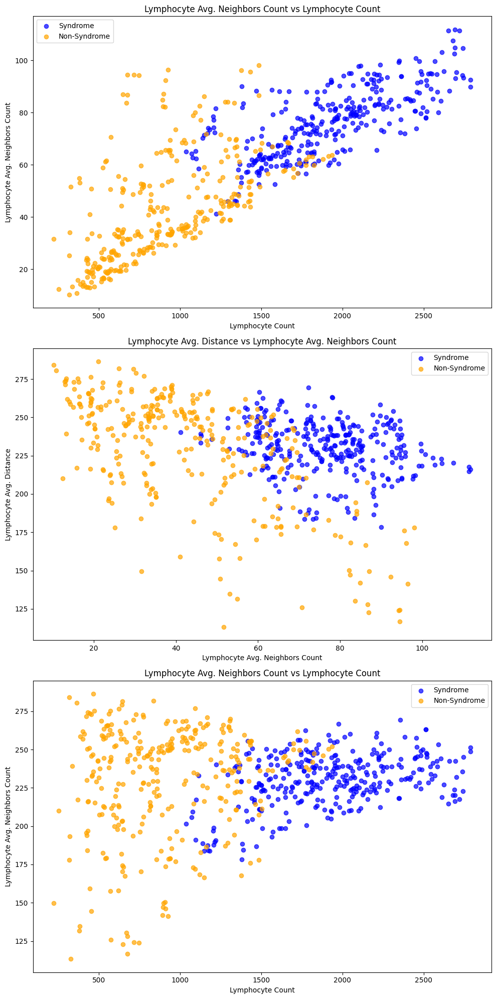

In [189]:
# Data
syndrome_data = [
    (dark_points_count_syndrome, avg_neighbors_count_syndrome),
    (avg_neighbors_count_syndrome, avg_distance_syndrome),
    (dark_points_count_syndrome, avg_distance_syndrome)
]

non_syndrome_data = [
    (dark_points_count_non_syndrome, avg_neighbors_count_non_syndrome),
    (avg_neighbors_count_non_syndrome, avg_distance_non_syndrome),
    (dark_points_count_non_syndrome, avg_distance_non_syndrome)
]

plots_titles = [['Lymphocyte Avg. Neighbors Count', 'Lymphocyte Count'],
                ['Lymphocyte Avg. Distance', 'Lymphocyte Avg. Neighbors Count'],
                ['Lymphocyte Avg. Neighbors Count', 'Lymphocyte Count']]

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 20))

for i in range(3):
    # Plot Syndrome points in blue
    axs[i].scatter(syndrome_data[i][0], syndrome_data[i][1], color='blue', label='Syndrome', alpha=0.7)

    # Plot Non-Syndrome points in orange
    axs[i].scatter(non_syndrome_data[i][0], non_syndrome_data[i][1], color='orange', label='Non-Syndrome', alpha=0.7)

    # Set labels and title
    axs[i].set_xlabel(plots_titles[i][1])
    axs[i].set_ylabel(plots_titles[i][0])
    axs[i].set_title(f'{plots_titles[i][0]} vs {plots_titles[i][1]}')
    axs[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

## Features Dataset Preparation

In [190]:
np.random.seed(42)

# Flatten the features
syndrome_features_train = syndrome_features_extended_train_29
non_syndrome_features_train = non_syndrome_features_extended_train_29

syndrome_features_test = syndrome_features_extended_test_29
non_syndrome_features_test = non_syndrome_features_extended_test_29

# Create labels for the features
syndrome_labels_train = np.ones(syndrome_features_train.shape[0])
non_syndrome_labels_train = np.zeros(non_syndrome_features_train.shape[0])

syndrome_labels_test = np.ones(syndrome_features_test.shape[0])
non_syndrome_labels_test = np.zeros(non_syndrome_features_test.shape[0])

# Concatenate features and labels
X_train = np.concatenate([syndrome_features_train, non_syndrome_features_train], axis=0)
y_train = np.concatenate([syndrome_labels_train, non_syndrome_labels_train], axis=0)

X_test = np.concatenate([syndrome_features_test, non_syndrome_features_test], axis=0)
y_test = np.concatenate([syndrome_labels_test, non_syndrome_labels_test], axis=0)

# Standardize the features using PyTorch tensors
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert data to PyTorch tensors
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32)

# Create datasets and dataloaders
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False)

## Shallow Neural Networks Training and Evaluation

In [224]:
# Function to train the model
def train_model(model, dataloader, criterion, optimizer, num_epochs=10):

    for layer in model.children():
        if hasattr(layer, 'reset_parameters'):
            layer.reset_parameters()

    train_losses = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for inputs, labels in dataloader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        epoch_loss = running_loss / len(dataloader)
        train_losses.append(epoch_loss)
        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')

    return train_losses

# Function to plot learning curves
def plot_learning_curve(train_losses):
    plt.plot(train_losses, label='Training Loss', marker='o')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Learning Curve')
    plt.legend()
    plt.show()

# Function to evaluate the model
def evaluate_model(model, dataloader):
    model.eval()
    all_preds, all_labels = [], []
    misclassified_images = []

    with torch.no_grad():
        i = 0
        j = 0
        for inputs, labels in dataloader:
            print(len(inputs), len(labels))
            outputs = model(inputs)
            preds = (outputs.squeeze() > 0.5).int()
            all_preds.extend(preds.numpy())
            all_labels.extend(labels.numpy())

            # Check if the prediction is incorrect
            for pred, label in zip(preds, labels):
                if pred != label:
                    misclassified_images.append((i if label == 0 else j, int(label)))
                if label == 0:
                    i+=1
                else:
                    j+=1
        print(misclassified_images)

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)

    print(f'Accuracy: {accuracy:.2f}')
    print(f'Precision: {precision:.2f}')
    print(f'Recall: {recall:.2f}')
    print(f'F1 Score: {f1:.2f}')

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    print('Confusion Matrix:')
    print(cm)

    # Plot Confusion Matrix
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    plt.xticks([0, 1], ['Non-Syndrome', 'Syndrome'])
    plt.yticks([0, 1], ['Non-Syndrome', 'Syndrome'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    # Display misclassified images
    for i, label in misclassified_images:
        cv2_imshow(syndrome_tensor_test[i].permute(1, 2, 0).numpy() if label == 1 else non_syndrome_tensor_test[i].permute(1, 2, 0).numpy())
        print(f"Predicted: {'Non-Syndrome' if label == 1 else 'Syndrome'}, Actual: {'Syndrome' if label == 1 else 'Non-Syndrome'}")  # Assuming binary labels

def train_model_with_cross_validation(model, dataset, criterion, optimizer, num_epochs=10, num_folds=5):
    train_losses = []
    val_losses = []

    # Create KFold cross-validation iterator
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

    for fold, (train_indices, val_indices) in enumerate(kf.split(dataset)):
        print(f"Fold {fold + 1}/{num_folds}")

        # Create data loaders for this fold
        train_subset = torch.utils.data.Subset(dataset, train_indices)
        val_subset = torch.utils.data.Subset(dataset, val_indices)

        train_dataloader = torch.utils.data.DataLoader(train_subset, batch_size=32, shuffle=True)
        val_dataloader = torch.utils.data.DataLoader(val_subset, batch_size=32, shuffle=False)

        # Reset the model for each fold
        for layer in model.children():
            if hasattr(layer, 'reset_parameters'):
                layer.reset_parameters()

        fold_train_losses = []  # Training losses for this fold
        fold_val_losses = []  # Validation losses for this fold

        for epoch in range(num_epochs):
            model.train()
            train_running_loss = 0.0

            for inputs, labels in train_dataloader:
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs.squeeze(), labels)
                loss.backward()
                optimizer.step()

                train_running_loss += loss.item()

            train_epoch_loss = train_running_loss / len(train_dataloader)
            fold_train_losses.append(train_epoch_loss)
            print(f'Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_epoch_loss:.4f}')

            model.eval()  # Switch to evaluation mode
            val_running_loss = 0.0

            with torch.no_grad():
                for inputs, labels in val_dataloader:
                    outputs = model(inputs)
                    loss = criterion(outputs.squeeze(), labels)
                    val_running_loss += loss.item()

            val_epoch_loss = val_running_loss / len(val_dataloader)
            fold_val_losses.append(val_epoch_loss)
            print(f'Epoch {epoch + 1}/{num_epochs}, Validation Loss: {val_epoch_loss:.4f}')

        train_losses.append(fold_train_losses)
        val_losses.append(fold_val_losses)

    return train_losses, val_losses

### Multi-Layer Perceptron (MLP)

In [209]:
torch.manual_seed(42)
np.random.seed(42)

# Define Multi-Layer Perceptron (MLP)
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size, dropout_prob=0.25):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size1, hidden_size2)
        self.relu2 = nn.ReLU()
        self.fc3 = nn.Linear(hidden_size2, output_size)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu1(x)
        x = self.fc2(x)
        x = self.relu2(x)
        x = self.fc3(x)
        return self.sigmoid(x)

## MLP 5-Fold Cross Validation and Generalization Curve

Fold 1/5
Epoch 1/100, Train Loss: 0.6473
Epoch 1/100, Validation Loss: 0.5862
Epoch 2/100, Train Loss: 0.5454
Epoch 2/100, Validation Loss: 0.4701
Epoch 3/100, Train Loss: 0.4177
Epoch 3/100, Validation Loss: 0.3429
Epoch 4/100, Train Loss: 0.3064
Epoch 4/100, Validation Loss: 0.2503
Epoch 5/100, Train Loss: 0.2409
Epoch 5/100, Validation Loss: 0.1984
Epoch 6/100, Train Loss: 0.2083
Epoch 6/100, Validation Loss: 0.1667
Epoch 7/100, Train Loss: 0.1910
Epoch 7/100, Validation Loss: 0.1466
Epoch 8/100, Train Loss: 0.1803
Epoch 8/100, Validation Loss: 0.1353
Epoch 9/100, Train Loss: 0.1734
Epoch 9/100, Validation Loss: 0.1312
Epoch 10/100, Train Loss: 0.1690
Epoch 10/100, Validation Loss: 0.1243
Epoch 11/100, Train Loss: 0.1646
Epoch 11/100, Validation Loss: 0.1204
Epoch 12/100, Train Loss: 0.1617
Epoch 12/100, Validation Loss: 0.1189
Epoch 13/100, Train Loss: 0.1582
Epoch 13/100, Validation Loss: 0.1157
Epoch 14/100, Train Loss: 0.1561
Epoch 14/100, Validation Loss: 0.1143
Epoch 15/100, T

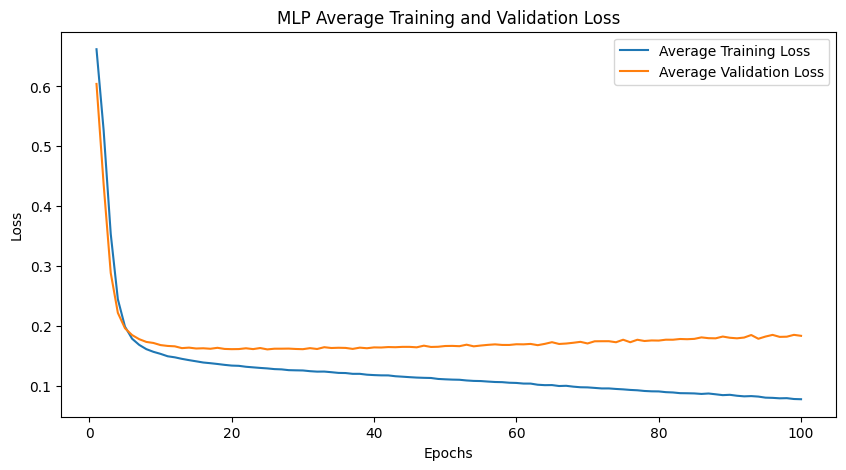

In [218]:
input_size = X_train.shape[1]
hidden_size1 = 64
hidden_size2 = 32
output_size = 1
mlp_model = MLP(input_size, hidden_size1, hidden_size2, output_size)

# Define loss function and optimizer
criterion = nn.BCELoss()
optimizer = optim.Adam(mlp_model.parameters(), lr=0.001)

# Example usage
train_losses, val_losses = train_model_with_cross_validation(mlp_model, train_dataset, criterion, optimizer, num_epochs=100, num_folds=5)

# Calculate the average training and validation losses across all folds for each epoch
avg_train_losses = np.mean(train_losses, axis=0)
avg_val_losses = np.mean(val_losses, axis=0)

# Plot the average training and validation loss per epoch
epochs = range(1, len(avg_train_losses) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, avg_train_losses, label='Average Training Loss')
plt.plot(epochs, avg_val_losses, label='Average Validation Loss')

plt.title('MLP Average Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Definite MLP Model Training

Epoch 1/5, Loss: 0.6417
Epoch 2/5, Loss: 0.5076
Epoch 3/5, Loss: 0.3500
Epoch 4/5, Loss: 0.2476
Epoch 5/5, Loss: 0.2004


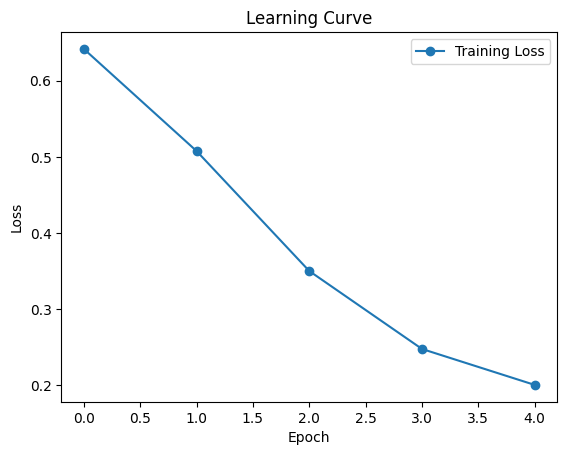

32 32
8 8
[(8, 0)]
Accuracy: 0.97
Precision: 0.95
Recall: 1.00
F1 Score: 0.98
Confusion Matrix:
[[19  1]
 [ 0 20]]


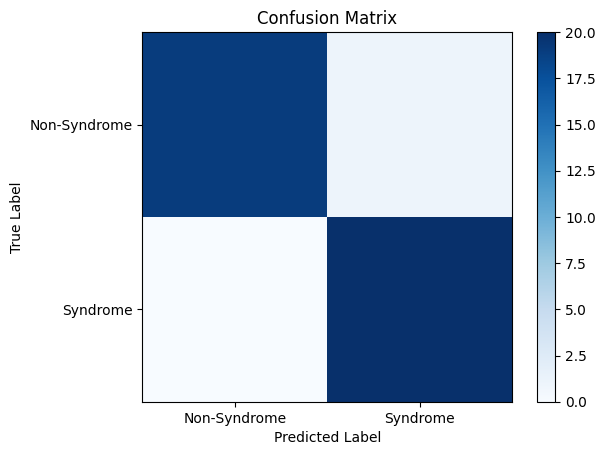

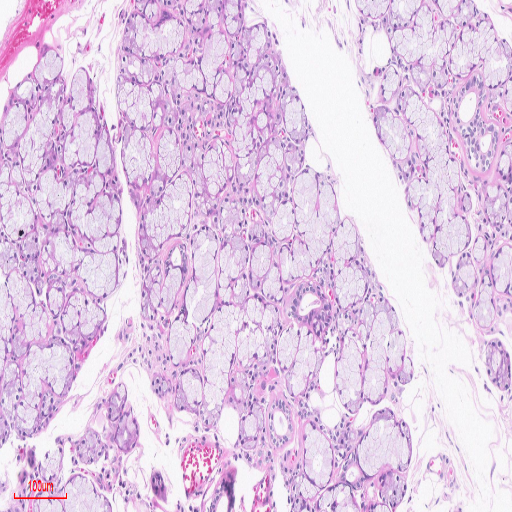

Predicted: Syndrome, Actual: Non-Syndrome


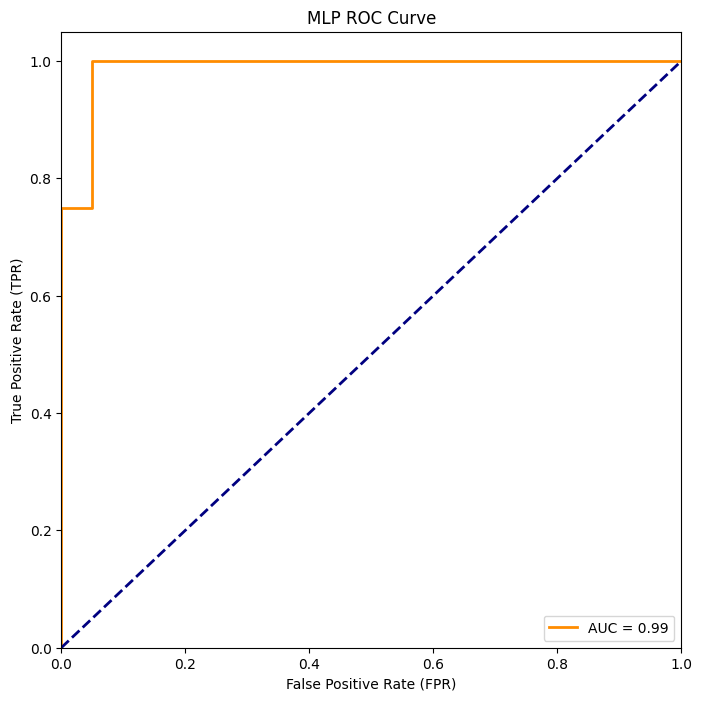

In [231]:
torch.manual_seed(42)
np.random.seed(42)

input_size = X_train.shape[1]
hidden_size1 = 64
hidden_size2 = 32
output_size = 1
mlp_model = MLP(input_size, hidden_size1, hidden_size2, output_size)

# Define loss function and optimizer
criterion = nn.BCELoss()
optimizer = optim.Adam(mlp_model.parameters(), lr=0.001)

# Train the model
train_losses = train_model(mlp_model, train_dataloader, criterion, optimizer, num_epochs=5)

# Plot learning curve
plot_learning_curve(train_losses)

# Evaluate the model
evaluate_model(mlp_model, test_dataloader)

model_path = 'mlp_model.pth'
torch.save(mlp_model.state_dict(), model_path)

# Evaluate the model on the test set
mlp_model.eval()
with torch.no_grad():
    y_pred = mlp_model(X_test_tensor)

# Convert predictions and true labels to numpy arrays
y_pred_np = y_pred.numpy()
y_test_np = y_test_tensor.numpy()

# Calculate the false positive rate (fpr), true positive rate (tpr), and thresholds
fpr, tpr, thresholds = roc_curve(y_test_np, y_pred_np)

# Calculate the area under the ROC curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('MLP ROC Curve')
plt.legend(loc='lower right')
plt.show()

## Radial Basis Function Neural Network (RBF NN)

In [227]:
# Define a custom RBF activation function
class RBFActivation(nn.Module):
    def __init__(self, num_centers, input_dim):
        super(RBFActivation, self).__init__()
        self.centers = nn.Parameter(torch.randn(num_centers, input_dim), requires_grad=True)
        self.beta = nn.Parameter(torch.ones(num_centers), requires_grad=True)

    def forward(self, x):
        x = x.unsqueeze(1)  # Add a dimension for broadcasting
        dist = torch.sqrt(torch.sum((x - self.centers) ** 2, dim=2))
        rbf = torch.exp(-self.beta * dist)
        return rbf

# Define the single-hidden-layer RBF network for binary classification
class RBFNet(nn.Module):
    def __init__(self, input_dim, num_centers):
        super(RBFNet, self).__init__()
        self.rbf_layer = RBFActivation(num_centers, input_dim)
        self.fc = nn.Linear(num_centers, 1)

    def forward(self, x):
        rbf_output = self.rbf_layer(x)
        output = torch.sigmoid(self.fc(rbf_output))
        return output

## RBF-NN 5-Fold Cross Validation and Generalization Curve

Fold 1/5
Epoch 1/100, Train Loss: 0.6928
Epoch 1/100, Validation Loss: 0.6956
Epoch 2/100, Train Loss: 0.6922
Epoch 2/100, Validation Loss: 0.6950
Epoch 3/100, Train Loss: 0.6915
Epoch 3/100, Validation Loss: 0.6946
Epoch 4/100, Train Loss: 0.6908
Epoch 4/100, Validation Loss: 0.6937
Epoch 5/100, Train Loss: 0.6899
Epoch 5/100, Validation Loss: 0.6926
Epoch 6/100, Train Loss: 0.6887
Epoch 6/100, Validation Loss: 0.6909
Epoch 7/100, Train Loss: 0.6871
Epoch 7/100, Validation Loss: 0.6888
Epoch 8/100, Train Loss: 0.6849
Epoch 8/100, Validation Loss: 0.6861
Epoch 9/100, Train Loss: 0.6819
Epoch 9/100, Validation Loss: 0.6819
Epoch 10/100, Train Loss: 0.6779
Epoch 10/100, Validation Loss: 0.6765
Epoch 11/100, Train Loss: 0.6724
Epoch 11/100, Validation Loss: 0.6695
Epoch 12/100, Train Loss: 0.6653
Epoch 12/100, Validation Loss: 0.6606
Epoch 13/100, Train Loss: 0.6562
Epoch 13/100, Validation Loss: 0.6490
Epoch 14/100, Train Loss: 0.6447
Epoch 14/100, Validation Loss: 0.6353
Epoch 15/100, T

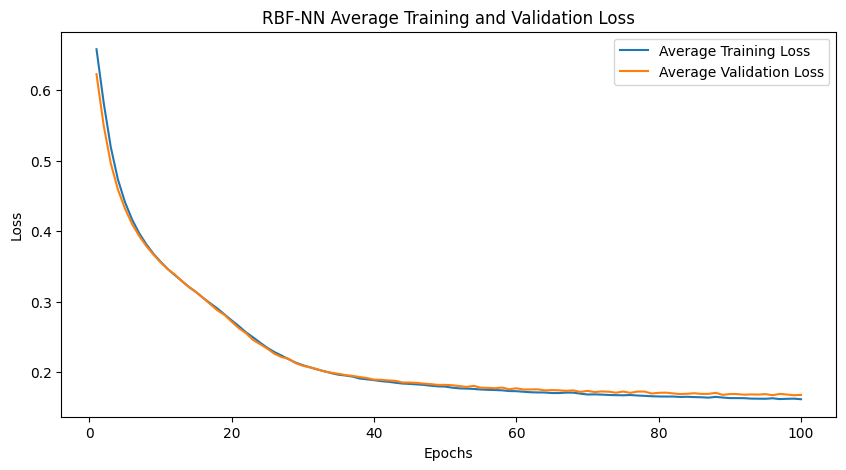

In [228]:
# Instantiate the RBFNet model
input_dim = X_train.shape[1]
num_centers = 100  # You can adjust the number of RBF centers
output_dim = 1
rbf_model = RBFNet(input_dim, num_centers)

# Define loss function and optimizer
criterion = nn.BCELoss()
optimizer = optim.Adam(rbf_model.parameters(), lr=0.001)

# Training loop, validation, and plotting can be done as usual

# Example usage
train_losses, val_losses = train_model_with_cross_validation(rbf_model, train_dataset, criterion, optimizer, num_epochs=100, num_folds=5)

# Calculate the average training and validation losses across all folds for each epoch
avg_train_losses = np.mean(train_losses, axis=0)
avg_val_losses = np.mean(val_losses, axis=0)

# Plot the average training and validation loss per epoch
epochs = range(1, len(avg_train_losses) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, avg_train_losses, label='Average Training Loss')
plt.plot(epochs, avg_val_losses, label='Average Validation Loss')

plt.title('RBF-NN Average Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Definite RBF-NN Model Training

Epoch 1/30, Loss: 0.6343
Epoch 2/30, Loss: 0.5068
Epoch 3/30, Loss: 0.4176
Epoch 4/30, Loss: 0.3637
Epoch 5/30, Loss: 0.3271
Epoch 6/30, Loss: 0.3034
Epoch 7/30, Loss: 0.2853
Epoch 8/30, Loss: 0.2696
Epoch 9/30, Loss: 0.2581
Epoch 10/30, Loss: 0.2493
Epoch 11/30, Loss: 0.2412
Epoch 12/30, Loss: 0.2342
Epoch 13/30, Loss: 0.2287
Epoch 14/30, Loss: 0.2241
Epoch 15/30, Loss: 0.2203
Epoch 16/30, Loss: 0.2175
Epoch 17/30, Loss: 0.2132
Epoch 18/30, Loss: 0.2096
Epoch 19/30, Loss: 0.2064
Epoch 20/30, Loss: 0.2047
Epoch 21/30, Loss: 0.2025
Epoch 22/30, Loss: 0.2003
Epoch 23/30, Loss: 0.1979
Epoch 24/30, Loss: 0.1960
Epoch 25/30, Loss: 0.1946
Epoch 26/30, Loss: 0.1931
Epoch 27/30, Loss: 0.1917
Epoch 28/30, Loss: 0.1901
Epoch 29/30, Loss: 0.1892
Epoch 30/30, Loss: 0.1880


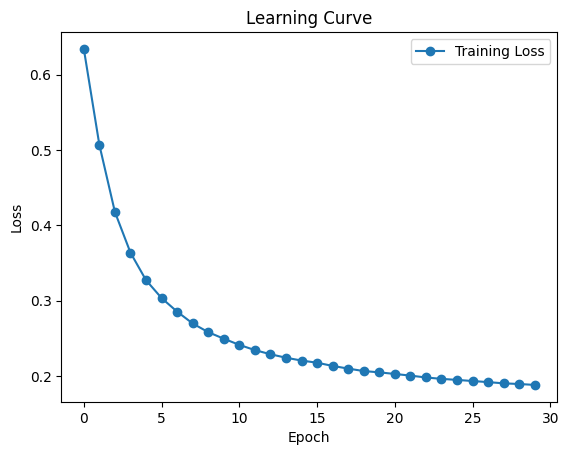

32 32
8 8
[(0, 0), (8, 0)]
Accuracy: 0.95
Precision: 0.91
Recall: 1.00
F1 Score: 0.95
Confusion Matrix:
[[18  2]
 [ 0 20]]


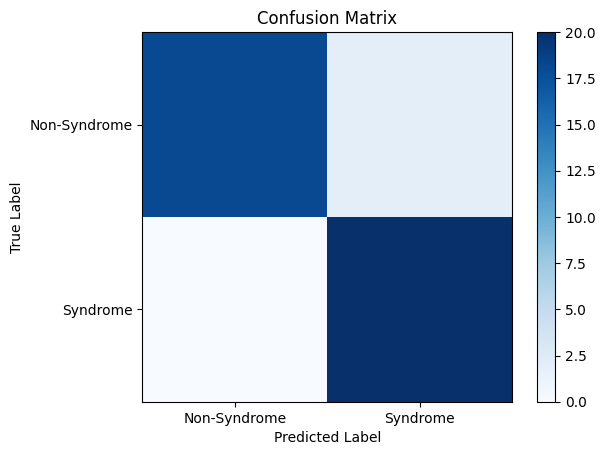

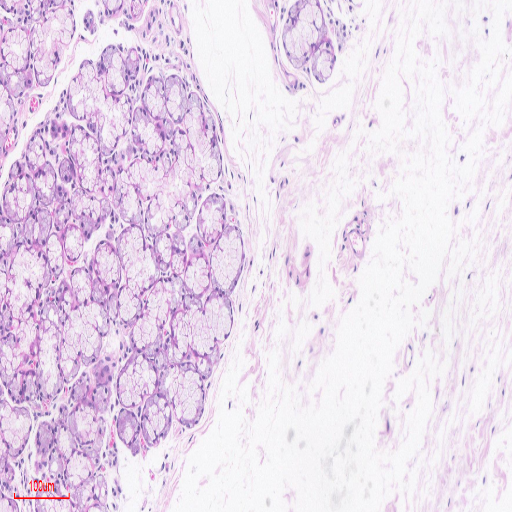

Predicted: Syndrome, Actual: Non-Syndrome


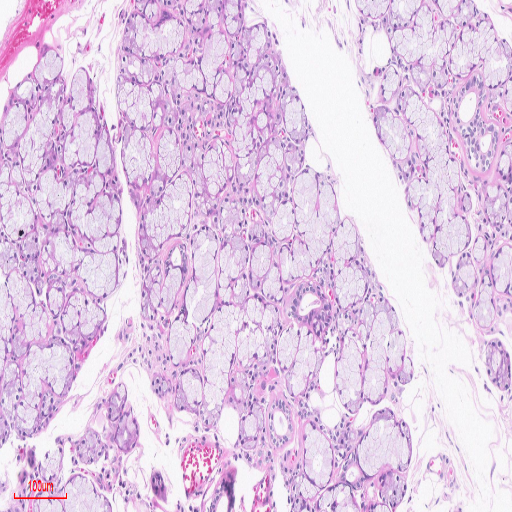

Predicted: Syndrome, Actual: Non-Syndrome


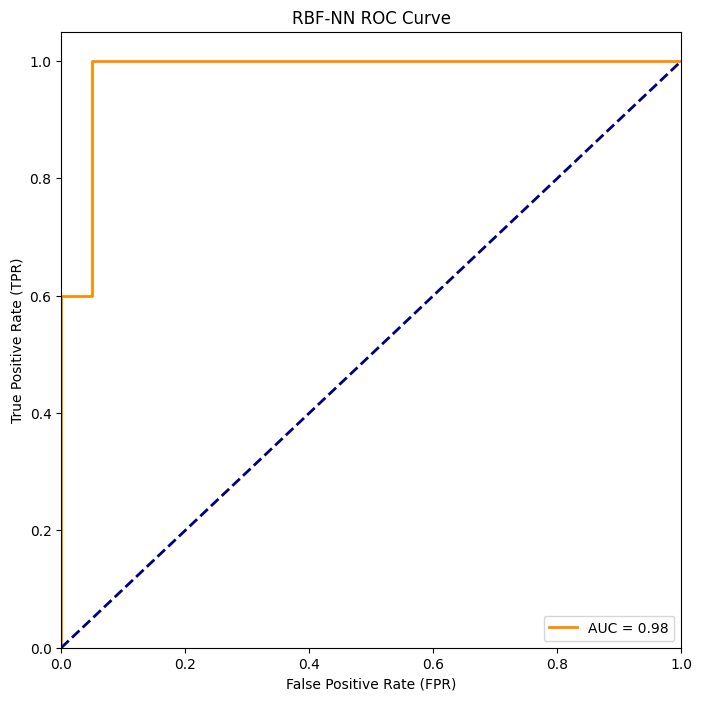

In [230]:
# Train the model
train_losses = train_model(rbf_model, train_dataloader, criterion, optimizer, num_epochs=30)

# Plot learning curve
plot_learning_curve(train_losses)

# Evaluate the model
evaluate_model(rbf_model, test_dataloader)

model_path = 'rbf_model.pth'
torch.save(rbf_model.state_dict(), model_path)

# Evaluate the model on the test set
rbf_model.eval()
with torch.no_grad():
    y_pred = rbf_model(X_test_tensor)

# Convert predictions and true labels to numpy arrays
y_pred_np = y_pred.numpy()
y_test_np = y_test_tensor.numpy()

# Calculate the false positive rate (fpr), true positive rate (tpr), and thresholds
fpr, tpr, thresholds = roc_curve(y_test_np, y_pred_np)

# Calculate the area under the ROC curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('RBF-NN ROC Curve')
plt.legend(loc='lower right')
plt.show()